### 1. SETUP Y CONFIGURACIÓN


##### 1.1 Imports

In [1]:
# Core
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import os
from pathlib import Path

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision import models

# Image processing
from PIL import Image
from skimage import color, io
import cv2

# Metrics
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim
from skimage.color import deltaE_ciede2000  

# Utils
import warnings
warnings.filterwarnings('ignore')

# Verificar versiones
print(f"PyTorch version: {torch.__version__}")
print(f"Torchvision version: {torchvision.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

from utils import rgb_to_lab, lab_to_rgb, normalize_lab, denormalize_lab

PyTorch version: 2.9.1+cu128
Torchvision version: 0.24.1+cu128
CUDA available: True


##### 1.2 Configuración de Seeds


In [2]:
def set_seed(seed=42):
    """
    Configura seeds para reproducibilidad.
    """
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    print(f"Seed configurada: {seed}")

# Aplicar seed
set_seed(15)

Seed configurada: 15


##### 1.3 Hiperparámetros Globales


In [3]:
class Config:
    """
    Configuración global del proyecto.
    """
    # Paths
    DATA_DIR = Path("data/raw")
    SAMPLES_DIR = Path("data/samples")
    
    # Dataset
    IMG_SIZE = 256  
    BATCH_SIZE = 16  
    NUM_WORKERS = 4  
    
    # Training
    NUM_EPOCHS = 50  
    LEARNING_RATE = 1e-3
    WEIGHT_DECAY = 1e-4
    
    # Model
    BACKBONE = "resnet18"  
    PRETRAINED = True
    
    # Early stopping
    PATIENCE = 10
    
    # Reproducibilidad
    SEED = 12

config = Config()

print(" Configuración:")
print(f"  - Tamaño de imagen: {config.IMG_SIZE}x{config.IMG_SIZE}")
print(f"  - Batch size: {config.BATCH_SIZE}")
print(f"  - Learning rate: {config.LEARNING_RATE}")
print(f"  - Backbone: {config.BACKBONE}")
print(f"  - Epochs: {config.NUM_EPOCHS}")

 Configuración:
  - Tamaño de imagen: 256x256
  - Batch size: 16
  - Learning rate: 0.001
  - Backbone: resnet18
  - Epochs: 50


### 2. EXPLORACIÓN Y PREPARACIÓN DEL DATASET



#### 2.1 Verificación del Dataset

In [5]:
dataset_path = Path("data/imagewoof2-320")
assert dataset_path.exists(), "Dataset no encontrado. Descargar primero."

train_path = dataset_path / "train"
val_path = dataset_path / "val"

print("Dataset encontrado")
print(f"Train path: {train_path}")
print(f"Val path: {val_path}")

# Ver las clases de perros
classes = sorted([d.name for d in train_path.iterdir() if d.is_dir()])
print(f"\nClases de perros ({len(classes)}):")
for cls in classes:
    print(f"  - {cls}")

Dataset encontrado
Train path: data/imagewoof2-320/train
Val path: data/imagewoof2-320/val

Clases de perros (10):
  - n02086240
  - n02087394
  - n02088364
  - n02089973
  - n02093754
  - n02096294
  - n02099601
  - n02105641
  - n02111889
  - n02115641


#### 2.2 Exploración del Dataset


In [6]:
import glob

# Contar imágenes
train_images = glob.glob(str(train_path / "*" / "*.JPEG"))
val_images = glob.glob(str(val_path / "*" / "*.JPEG"))

print(f"Total imágenes de entrenamiento: {len(train_images)}")
print(f"Total imágenes de validación: {len(val_images)}")

# Clases disponibles
classes = sorted([d.name for d in train_path.iterdir() if d.is_dir()])
print(f"\nNúmero de clases: {len(classes)}")
print(f"Clases: {classes}")

# Distribución por clase
print("\nDistribución por clase (train):")
for cls in classes:
    n_images = len(list((train_path / cls).glob("*.JPEG")))
    print(f"  {cls}: {n_images} imágenes")

Total imágenes de entrenamiento: 9025
Total imágenes de validación: 3929

Número de clases: 10
Clases: ['n02086240', 'n02087394', 'n02088364', 'n02089973', 'n02093754', 'n02096294', 'n02099601', 'n02105641', 'n02111889', 'n02115641']

Distribución por clase (train):
  n02086240: 941 imágenes
  n02087394: 942 imágenes
  n02088364: 932 imágenes
  n02089973: 580 imágenes
  n02093754: 949 imágenes
  n02096294: 943 imágenes
  n02099601: 949 imágenes
  n02105641: 928 imágenes
  n02111889: 921 imágenes
  n02115641: 940 imágenes


In [7]:
# %%
# Mapping clase (folder) -> índice numérico y viceversa
class_to_idx = {cls_name: i for i, cls_name in enumerate(sorted(classes))}
idx_to_class = {i: cls_name for cls_name, i in class_to_idx.items()}

print("Mapping clase -> idx:")
for cls_name, idx in class_to_idx.items():
    print(f"  {cls_name} -> {idx}")


Mapping clase -> idx:
  n02086240 -> 0
  n02087394 -> 1
  n02088364 -> 2
  n02089973 -> 3
  n02093754 -> 4
  n02096294 -> 5
  n02099601 -> 6
  n02105641 -> 7
  n02111889 -> 8
  n02115641 -> 9


#### 2.3 Visualización de Ejemplos RGB


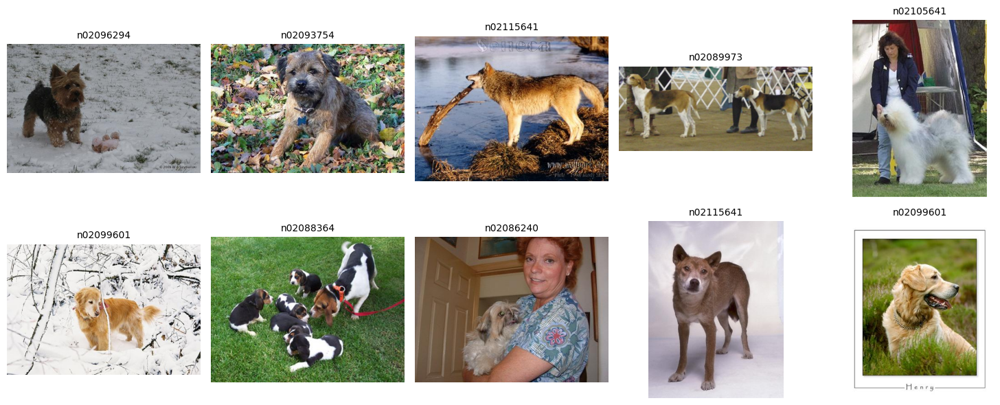

In [8]:
def visualize_random_samples(n_samples=10):
    """
    Visualiza muestras aleatorias del dataset.
    """
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    axes = axes.flatten()
    
    random_images = np.random.choice(train_images, n_samples, replace=False)
    
    for idx, img_path in enumerate(random_images):
        img = Image.open(img_path).convert('RGB')
        
        # Obtener clase
        class_id = Path(img_path).parent.name
        class_name = class_id
        
        axes[idx].imshow(img)
        axes[idx].set_title(class_name, fontsize=10)
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_random_samples(10)

#### 2.4 Conversión RGB → Grayscale → LAB

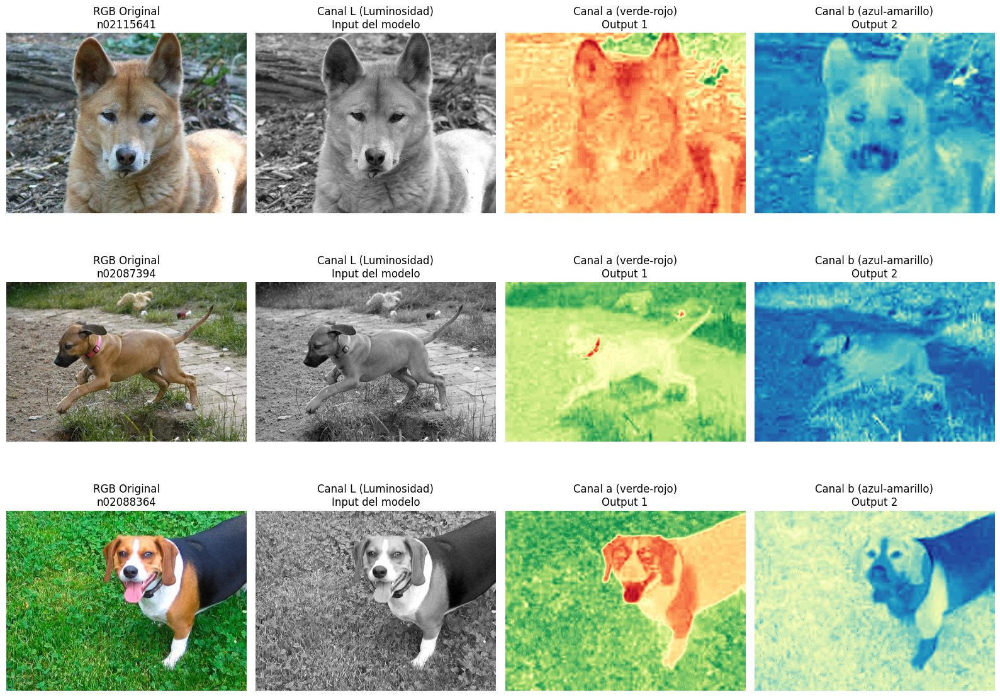

In [9]:
def visualize_color_spaces(n_samples=3):
    """
    Visualiza el proceso de conversión de espacios de color.
    """
    random_images = np.random.choice(train_images, n_samples, replace=False)
    
    fig, axes = plt.subplots(n_samples, 4, figsize=(16, 4*n_samples))
    
    for row, img_path in enumerate(random_images):
        # Cargar imagen RGB
        img_rgb = np.array(Image.open(img_path).convert('RGB')) / 255.0
        
        # Convertir a LAB
        img_lab = color.rgb2lab(img_rgb)
        
        # Extraer canales
        L = img_lab[:, :, 0]  # Luminosidad (grayscale)
        a = img_lab[:, :, 1]  # Canal a
        b = img_lab[:, :, 2]  # Canal b
        
        # Obtener clase
        class_id = Path(img_path).parent.name
        class_name = class_id
        
        # Plot
        axes[row, 0].imshow(img_rgb)
        axes[row, 0].set_title(f'RGB Original\n{class_name}')
        axes[row, 0].axis('off')
        
        axes[row, 1].imshow(L, cmap='gray')
        axes[row, 1].set_title('Canal L (Luminosidad)\nInput del modelo')
        axes[row, 1].axis('off')
        
        axes[row, 2].imshow(a, cmap='RdYlGn_r')
        axes[row, 2].set_title('Canal a (verde-rojo)\nOutput 1')
        axes[row, 2].axis('off')
        
        axes[row, 3].imshow(b, cmap='YlGnBu_r')
        axes[row, 3].set_title('Canal b (azul-amarillo)\nOutput 2')
        axes[row, 3].axis('off')
    
    plt.tight_layout()
    plt.show()

visualize_color_spaces(3)

### 3. DATA PIPELINE



In [10]:
class ColorizationDatasetWithLabels(Dataset):
    """
    Dataset para colorización de imágenes + clasificación de clase.
    
    Input:
        - L (canal de luminancia)  -> (1, H, W)
    Targets:
        - ab (canales de color)    -> (2, H, W)
        - label (índice de clase)  -> int en [0, num_clases-1]
    """
    def __init__(self, image_paths, class_to_idx, transform=None, img_size=256):
        self.image_paths = image_paths
        self.class_to_idx = class_to_idx
        self.transform = transform
        self.img_size = img_size
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        
        # Cargar imagen RGB
        img_rgb = Image.open(img_path).convert('RGB')
        img_rgb = img_rgb.resize((self.img_size, self.img_size), Image.BICUBIC)
        img_rgb = np.array(img_rgb) / 255.0
        
        # Data augmentation
        if self.transform:
            img_rgb = self.transform(img_rgb)
        
        # RGB -> LAB
        img_lab = rgb_to_lab(img_rgb)
        L = img_lab[:, :, 0:1]   # (H,W,1)
        ab = img_lab[:, :, 1:]   # (H,W,2)
        
        # Normalización
        L = L / 100.0            
        ab = ab / 128.0          
        
        # Tensores (C,H,W)
        L  = torch.from_numpy(L.transpose(2, 0, 1)).float()
        ab = torch.from_numpy(ab.transpose(2, 0, 1)).float()
        
        # Label de clase según carpeta
        class_id = Path(img_path).parent.name  
        label = self.class_to_idx[class_id]
        label = torch.tensor(label, dtype=torch.long)
        
        return L, ab, label


print("ColorizationDatasetWithLabels definido.")


ColorizationDatasetWithLabels definido.


#### 3.1 Data Augmentation


In [11]:
class ImageAugmentation:
    """
    Data augmentation para imágenes RGB.
    Se aplica ANTES de convertir a LAB.
    """
    
    def __init__(self, p=0.5):
        """
        Args:
            p: probabilidad de aplicar cada transformación
        """
        self.p = p
    
    def __call__(self, img):
        """
        Args:
            img: numpy array (H, W, 3) en rango [0, 1]
        
        Returns:
            img_aug: numpy array aumentado
        """
        # Horizontal flip
        if np.random.random() < self.p:
            img = np.fliplr(img)
        
        # Ajustes de brillo (pequeños)
        if np.random.random() < self.p:
            factor = np.random.uniform(0.8, 1.2)
            img = np.clip(img * factor, 0, 1)
        
        # Ajustes de contraste (pequeños)
        if np.random.random() < self.p:
            factor = np.random.uniform(0.8, 1.2)
            mean = img.mean()
            img = np.clip((img - mean) * factor + mean, 0, 1)
        
        return img

# Crear transformación
train_transform = ImageAugmentation(p=0.5)

print("Data augmentation configurado")
print("Transformaciones: horizontal flip, ajuste de brillo, ajuste de contraste")

Data augmentation configurado
Transformaciones: horizontal flip, ajuste de brillo, ajuste de contraste


#### 3.2 Carga de ResNet18 preentrenado en ImageNet


In [12]:
backbone = models.resnet18(pretrained=True)

# Ver la arquitectura
print("Arquitectura de ResNet18:")
print(backbone)
print("\n" + "="*50)

# Congelar todos los parámetros
for param in backbone.parameters():
    param.requires_grad = False

print("Todos los parámetros del backbone congelados")

# Mover a device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Arquitectura de ResNet18:
ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (re

#### 4 Setup para Modelado

Generados 400 bins de color válidos (de 400 candidatos)
Número de clases de color: Q = 400
Primeros 10 bins:
[[-110.        -110.       ]
 [-110.         -98.42105  ]
 [-110.         -86.8421   ]
 [-110.         -75.26316  ]
 [-110.         -63.68421  ]
 [-110.         -52.105263 ]
 [-110.         -40.526318 ]
 [-110.         -28.947369 ]
 [-110.         -17.368422 ]
 [-110.          -5.7894735]]


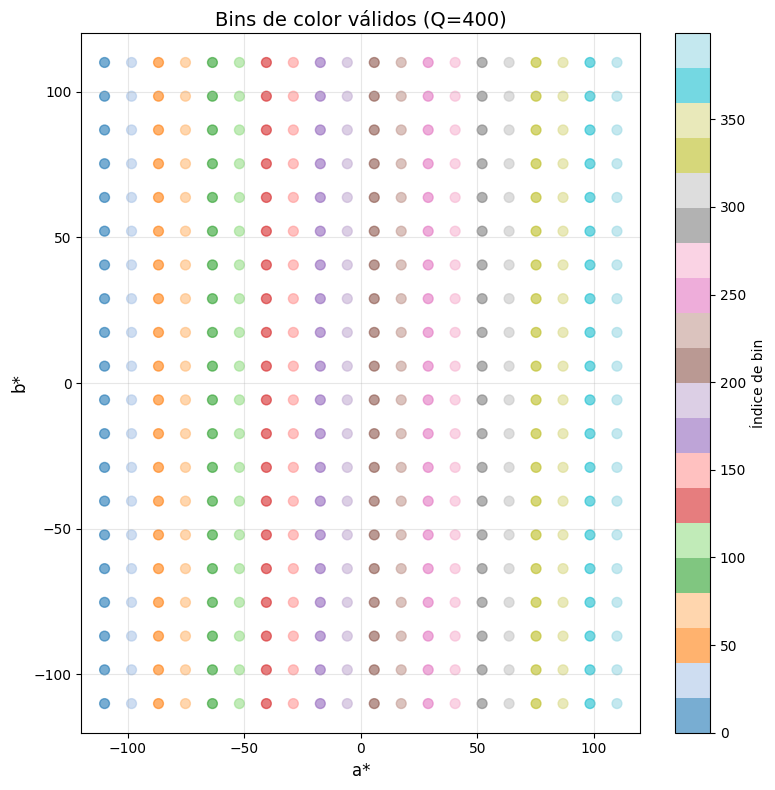

Bins guardados en pts_ab_torch: torch.Size([400, 2])


In [13]:
def generate_ab_bins(grid_size=20, L_value=50):
    """
    Genera una grilla uniforme de bins en espacio ab
    y filtra los que son válidos (dentro del gamut RGB).
    
    Args:
        grid_size: número de divisiones por eje (a y b)
        L_value: valor de luminancia para verificar gamut
    
    Returns:
        pts_ab: array (Q, 2) con centros de bins válidos
    """
    # Grilla uniforme en [-110, 110] para a y b
    a_range = np.linspace(-110, 110, grid_size)
    b_range = np.linspace(-110, 110, grid_size)
    
    pts_ab_list = []
    
    for a in a_range:
        for b in b_range:
            # Crear punto LAB
            lab_point = np.array([[[L_value, a, b]]], dtype=np.float32)
            
            # Intentar convertir a RGB
            try:
                rgb_point = color.lab2rgb(lab_point)
                
                if np.all(rgb_point >= 0) and np.all(rgb_point <= 1):
                    pts_ab_list.append([a, b])
            except:
                pass
    
    pts_ab = np.array(pts_ab_list, dtype=np.float32)
    
    print(f"Generados {len(pts_ab)} bins de color válidos (de {grid_size**2} candidatos)")
    
    return pts_ab

# Generar bins
pts_ab_np = generate_ab_bins(grid_size=20, L_value=50)
pts_ab_torch = torch.from_numpy(pts_ab_np)
Q = pts_ab_torch.shape[0]

print(f"Número de clases de color: Q = {Q}")
print(f"Primeros 10 bins:\n{pts_ab_np[:10]}")

# Visualizar distribución de bins
plt.figure(figsize=(8, 8))
plt.scatter(pts_ab_np[:, 0], pts_ab_np[:, 1], c=range(len(pts_ab_np)), 
            cmap='tab20', s=50, alpha=0.6)
plt.xlabel('a*', fontsize=12)
plt.ylabel('b*', fontsize=12)
plt.title(f'Bins de color válidos (Q={Q})', fontsize=14)
plt.grid(True, alpha=0.3)
plt.xlim(-120, 120)
plt.ylim(-120, 120)
plt.colorbar(label='Índice de bin')
plt.tight_layout()
plt.savefig('color_bins_distribution.png', dpi=150)
plt.show()

print(f"Bins guardados en pts_ab_torch: {pts_ab_torch.shape}")

#### 4.1 - Cuantización por chunks

In [14]:
class ColorizationDatasetQuantizedFast(Dataset):
    """
    Dataset optimizado: devuelve ab continuo, la cuantización se hace en batch
    """
    def __init__(self, image_paths, class_labels, img_size=256, transform=None):
        self.image_paths = image_paths
        self.class_labels = class_labels
        self.img_size = img_size
        self.transform = transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        class_label = self.class_labels[idx]
        
        img_rgb = Image.open(img_path).convert('RGB')
        img_rgb = img_rgb.resize((self.img_size, self.img_size), Image.BILINEAR)
        
        if self.transform:
            img_rgb = self.transform(img_rgb)
        
        img_rgb_np = np.array(img_rgb).astype(np.float32) / 255.0
        img_lab = color.rgb2lab(img_rgb_np)
        
        L = img_lab[:, :, 0] / 100.0
        a = img_lab[:, :, 1]
        b = img_lab[:, :, 2]
        
        L_tensor = torch.from_numpy(L).unsqueeze(0).float()
        ab_tensor = torch.from_numpy(np.stack([a, b], axis=0)).float()
        class_tensor = torch.tensor(class_label, dtype=torch.long)
        
        return L_tensor, ab_tensor, class_tensor


def quantize_ab_batch_chunked(ab_batch, pts_ab, chunk_size=8192):
    """
    Cuantiza un batch de ab en GPU usando chunks
    
    Args:
        ab_batch: (B, 2, H, W) tensor en GPU
        pts_ab: (Q, 2) tensor en GPU con centros de bins
        chunk_size: número de pixels a procesar por vez
    
    Returns:
        q_indices: (B, H, W) tensor con índices de bins
    """
    B, _, H, W = ab_batch.shape
    Q = pts_ab.shape[0]
    
    # Reshape: (B, 2, H, W) -> (B*H*W, 2)
    ab_flat = ab_batch.permute(0, 2, 3, 1).reshape(-1, 2)
    N = ab_flat.shape[0]
    
    # Procesar por chunks
    q_indices_list = []
    
    for start_idx in range(0, N, chunk_size):
        end_idx = min(start_idx + chunk_size, N)
        ab_chunk = ab_flat[start_idx:end_idx]  # (chunk_size, 2)
        
        # Distancias solo para este chunk
        # ab_chunk: (chunk, 2), pts_ab: (Q, 2)
        # Distancia euclidiana: sqrt(sum((a-b)^2))
        dists = torch.cdist(ab_chunk.unsqueeze(1), pts_ab.unsqueeze(0)).squeeze(1)  # (chunk, Q)
        
        # Bin más cercano
        q_chunk = torch.argmin(dists, dim=1)  # (chunk,)
        q_indices_list.append(q_chunk)
    
    # Concatenar todos los chunks
    q_indices = torch.cat(q_indices_list, dim=0)  # (B*H*W,)
    q_indices = q_indices.reshape(B, H, W)
    
    return q_indices


print("ColorizationDatasetQuantizedFast definido")
print("quantize_ab_batch_chunked definido (memory-efficient)")

ColorizationDatasetQuantizedFast definido
quantize_ab_batch_chunked definido (memory-efficient)


#### 4.2 Modelo

In [15]:
class UNetColorizerGlobalV4(nn.Module):
    """
    Modelo de colorización con cuantización de colores.
    
    Arquitectura:
    - Encoder: ResNet18 preentrenado (congelado)
    - Decoder: U-Net con skip connections
    - Rama global: Clasificación de escena + fusión con features locales
    - Output: Q bins de color cuantizados
    """
    def __init__(self, num_color_classes, num_scene_classes, backbone=None, 
                 freeze_backbone=True, global_dim=256):
        super().__init__()
        
        if backbone is None:
            backbone = models.resnet18(pretrained=True)
        
        # Encoder ResNet18
        self.conv1 = backbone.conv1
        self.bn1 = backbone.bn1
        self.relu = backbone.relu
        self.maxpool = backbone.maxpool
        self.layer1 = backbone.layer1
        self.layer2 = backbone.layer2
        self.layer3 = backbone.layer3
        self.layer4 = backbone.layer4
        
        if freeze_backbone:
            for p in backbone.parameters():
                p.requires_grad = False
        
        # Decoder U-Net
        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
            )
        
        self.up3 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.dec3 = conv_block(256 + 256, 256)
        
        self.up2 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.dec2 = conv_block(128 + 128, 128)
        
        self.up1 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.dec1 = conv_block(64 + 64, 64)
        
        self.up0 = nn.ConvTranspose2d(64, 32, kernel_size=2, stride=2)
        self.dec0 = conv_block(32 + 64, 32)
        
        self.up_out = nn.ConvTranspose2d(32, 16, kernel_size=2, stride=2)
        self.out_conv = nn.Conv2d(16, num_color_classes, kernel_size=1)
        
        # Rama global
        self.global_conv = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
        )
        
        self.global_pool = nn.AdaptiveAvgPool2d((1, 1))
        
        self.global_fc = nn.Sequential(
            nn.Linear(512, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, global_dim),
            nn.ReLU(inplace=True),
        )
        
        self.classifier = nn.Linear(global_dim, num_scene_classes)
        
        self.global_dim = global_dim
        self.num_color_classes = num_color_classes
        self.num_scene_classes = num_scene_classes
        
        # Fusión residual
        self.fusion3_proj = nn.Sequential(
            nn.Conv2d(global_dim, 256, kernel_size=1),
            nn.BatchNorm2d(256),
        )
        self.fusion3_gate = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=1),
            nn.Sigmoid()
        )
    
    def forward(self, x):
        # Replicar canal L a 3 canales para ResNet
        x = x.repeat(1, 3, 1, 1)
        
        # Encoder
        x0 = self.relu(self.bn1(self.conv1(x)))
        x1 = self.layer1(self.maxpool(x0))
        x2 = self.layer2(x1)
        x3 = self.layer3(x2)
        x4 = self.layer4(x3)
        
        # Rama global
        g_feat = self.global_conv(x4)
        g_pooled = self.global_pool(g_feat)
        g_vec = g_pooled.view(g_pooled.size(0), -1)
        g = self.global_fc(g_vec)
        scene_logits = self.classifier(g)
        
        # Decoder con skip connections
        d3 = self.up3(x4)
        d3 = torch.cat([d3, x3], dim=1)
        d3 = self.dec3(d3)
        
        # Fusión global-local
        B, C, H, W = d3.shape
        g_expand = g.view(B, self.global_dim, 1, 1).expand(-1, -1, H, W)
        g_spatial = self.fusion3_proj(g_expand)
        gate = self.fusion3_gate(g_spatial)
        d3 = d3 * (1.0 - gate) + g_spatial * gate
        
        # Resto del decoder
        d2 = self.up2(d3)
        d2 = torch.cat([d2, x2], dim=1)
        d2 = self.dec2(d2)
        
        d1 = self.up1(d2)
        d1 = torch.cat([d1, x1], dim=1)
        d1 = self.dec1(d1)
        
        d0 = self.up0(d1)
        d0 = torch.cat([d0, x0], dim=1)
        d0 = self.dec0(d0)
        
        d_out = self.up_out(d0)
        color_logits = self.out_conv(d_out)
        
        return color_logits, scene_logits

print("UNetColorizerGlobalV4 definido")

UNetColorizerGlobalV4 definido


#### 4.3 Preparacion de datasets y Dataloaders

In [16]:
# Split train/val/test
val_images_shuffled = val_images.copy()
np.random.shuffle(val_images_shuffled)

n_val = len(val_images_shuffled) // 2
val_images_final = val_images_shuffled[:n_val]
test_images_final = val_images_shuffled[n_val:]

print(f"Split del dataset:")
print(f"  Train: {len(train_images)} imágenes")
print(f"  Val: {len(val_images_final)} imágenes")
print(f"  Test: {len(test_images_final)} imágenes")

# Extraer labels de clase
train_labels_list = []
for img_path in train_images:
    class_name = os.path.basename(os.path.dirname(img_path))
    class_idx = class_to_idx[class_name]
    train_labels_list.append(class_idx)

val_labels_list = []
for img_path in val_images_final:
    class_name = os.path.basename(os.path.dirname(img_path))
    class_idx = class_to_idx[class_name]
    val_labels_list.append(class_idx)

print(f"Labels extraídos: train={len(train_labels_list)}, val={len(val_labels_list)}")

# Crear datasets
train_dataset_quant = ColorizationDatasetQuantizedFast(
    train_images, 
    train_labels_list, 
    img_size=config.IMG_SIZE, 
    transform=None
)

val_dataset_quant = ColorizationDatasetQuantizedFast(
    val_images_final,
    val_labels_list, 
    img_size=config.IMG_SIZE, 
    transform=None
)

print(f"Datasets creados:")
print(f"  Train: {len(train_dataset_quant)} imágenes")
print(f"  Val: {len(val_dataset_quant)} imágenes")

# Crear DataLoaders
train_loader_quant_small = DataLoader(
    train_dataset_quant, 
    batch_size=8,  
    shuffle=True, 
    num_workers=config.NUM_WORKERS, 
    pin_memory=True
)

val_loader_quant = DataLoader(
    val_dataset_quant, 
    batch_size=8, 
    shuffle=False, 
    num_workers=config.NUM_WORKERS, 
    pin_memory=True
)

print(f"DataLoaders creados:")
print(f"  Train: batch_size=8, {len(train_loader_quant_small)} batches")
print(f"  Val: batch_size=8, {len(val_loader_quant)} batches")

# Test de cuantización
L_test, ab_test, label_test = next(iter(train_loader_quant_small))
L_test = L_test.to(device)
ab_test = ab_test.to(device)
pts_ab_gpu = pts_ab_torch.to(device)

import time
t0 = time.time()
q_test = quantize_ab_batch_chunked(ab_test, pts_ab_gpu, chunk_size=8192)
t1 = time.time()

print(f"\nTest de cuantización:")
print(f"  Input ab: {ab_test.shape}")
print(f"  Output q_indices: {q_test.shape}")
print(f"  Tiempo: {(t1-t0)*1000:.2f} ms")
print(f"  Bins únicos: {q_test.unique().numel()} de {Q}")

Split del dataset:
  Train: 9025 imágenes
  Val: 1964 imágenes
  Test: 1965 imágenes
Labels extraídos: train=9025, val=1964
Datasets creados:
  Train: 9025 imágenes
  Val: 1964 imágenes
DataLoaders creados:
  Train: batch_size=8, 1129 batches
  Val: batch_size=8, 246 batches

Test de cuantización:
  Input ab: torch.Size([8, 2, 256, 256])
  Output q_indices: torch.Size([8, 256, 256])
  Tiempo: 352.74 ms
  Bins únicos: 76 de 400


#### 4.4 Mini Test del Modelo

In [17]:
# Test forward pass del modelo
backbone_test = models.resnet18(pretrained=True)
model_test = UNetColorizerGlobalV4(
    num_color_classes=Q,
    num_scene_classes=len(classes),
    backbone=backbone_test,
    freeze_backbone=True,
    global_dim=256,
).to(device)

L_test, ab_test, labels_test = next(iter(train_loader_quant_small))
L_test = L_test.to(device)

with torch.no_grad():
    color_logits, scene_logits = model_test(L_test)

print(f"Forward pass exitoso:")
print(f"  Input L: {L_test.shape}")
print(f"  Output color_logits: {color_logits.shape}")
print(f"  Output scene_logits: {scene_logits.shape}")

del model_test
torch.cuda.empty_cache()

Forward pass exitoso:
  Input L: torch.Size([8, 1, 256, 256])
  Output color_logits: torch.Size([8, 400, 256, 256])
  Output scene_logits: torch.Size([8, 10])


#### 4.5 Calculo de Class Weights

In [17]:
def compute_color_class_weights_safe(train_loader, pts_ab, num_classes, device, 
                                     lambda_smooth=0.5, max_batches=100):
    """
    Calcula pesos de clase basados en frecuencias de bins de color.
    """
    print(f"Calculando frecuencias de {num_classes} clases...")
    
    pts_ab_gpu = pts_ab.to(device)
    counts = torch.zeros(num_classes, dtype=torch.long, device=device)
    total_pixels = 0
    
    for batch_idx, (L, ab, _) in enumerate(train_loader):
        if batch_idx >= max_batches:
            break
        
        ab = ab.to(device)
        q_indices = quantize_ab_batch_chunked(ab, pts_ab_gpu, chunk_size=8192)
        q_flat = q_indices.view(-1)
        
        batch_counts = torch.bincount(q_flat, minlength=num_classes)
        counts += batch_counts
        total_pixels += q_flat.numel()
        
        # Mostrar progreso cada 20 batches
        if (batch_idx + 1) % 20 == 0:
            print(f"  Procesados {batch_idx + 1}/{max_batches} batches...")
    
    # Calcular probabilidades y pesos
    p_q = counts.float() / total_pixels
    p_q = torch.clamp(p_q, min=1e-8)
    
    class_weights = 1.0 / ((1.0 - lambda_smooth) * p_q + lambda_smooth)
    class_weights = class_weights / class_weights.mean()
    
    print(f"Frecuencias calculadas:")
    print(f"  Min freq: {p_q.min():.6f}, Max freq: {p_q.max():.6f}")
    print(f"  Min weight: {class_weights.min():.2f}, Max weight: {class_weights.max():.2f}")
    print(f"  Bins usados: {(counts > 0).sum().item()} de {num_classes}")
    
    return p_q, class_weights

# Calcular pesos
p_q, class_weights = compute_color_class_weights_safe(
    train_loader_quant_small,  
    pts_ab_torch,
    num_classes=Q, 
    device=device,
    lambda_smooth=0.5, 
    max_batches=100
)

print(f"Class weights calculados para {Q} bins")

Calculando frecuencias de 400 clases...
  Procesados 20/100 batches...
  Procesados 40/100 batches...
  Procesados 60/100 batches...
  Procesados 80/100 batches...
  Procesados 100/100 batches...
Frecuencias calculadas:
  Min freq: 0.000000, Max freq: 0.215341
  Min weight: 0.82, Max weight: 1.00
  Bins usados: 168 de 400
Class weights calculados para 400 bins


#### 4.6 Funcion de Decodificacion

In [18]:
def decode_ab_annealed(logits, pts_ab, T=0.38):
    """
    Decodifica logits de clases de color a canales ab continuos
    usando annealed-mean con temperatura T.
    
    Args:
        logits: (B, Q, H, W) logits sin softmax
        pts_ab: (Q, 2) centros de bins en LAB
        T: temperatura (default 0.38)
    
    Returns:
        ab_pred: (B, 2, H, W) canales ab continuos
    """
    probs = F.softmax(logits, dim=1)
    
    if T != 1.0:
        probs = probs ** (1.0 / T)
        probs = probs / probs.sum(dim=1, keepdim=True).clamp_min(1e-8)
    
    pts_ab = pts_ab.to(logits.device).float()
    ab_pred = torch.einsum('bqhw,qc->bchw', probs, pts_ab)
    
    return ab_pred

print("decode_ab_annealed definido")

# Test
with torch.no_grad():
    logits_fake = torch.randn(2, Q, 64, 64).to(device)
    pts_ab_gpu = pts_ab_torch.to(device)
    ab_decoded = decode_ab_annealed(logits_fake, pts_ab_gpu, T=0.38)
    
    print(f"Test decodificación:")
    print(f"  Input logits: {logits_fake.shape}")
    print(f"  Output ab: {ab_decoded.shape}")
    print(f"  Rango ab: [{ab_decoded.min():.2f}, {ab_decoded.max():.2f}]")

decode_ab_annealed definido
Test decodificación:
  Input logits: torch.Size([2, 400, 64, 64])
  Output ab: torch.Size([2, 2, 64, 64])
  Rango ab: [-103.88, 103.03]


#### 4.7 Funciones de entrenamiento y validacion

In [19]:
def calculate_metrics(L_batch, ab_pred, ab_true, lpips_model, device):
    """
    Calcula PSNR, SSIM, Delta E2000 y LPIPS para un batch.
    """
    B = L_batch.shape[0]
    
    psnr_values = []
    ssim_values = []
    delta_e_values = []
    
    # Desnormalizar L
    L_batch_np = (L_batch.cpu().numpy() * 100.0)
    ab_pred_np = ab_pred.cpu().numpy()
    ab_true_np = ab_true.cpu().numpy()
    
    rgb_pred_list = []
    rgb_true_list = []
    
    for i in range(B):
        # Reconstruir LAB
        L = L_batch_np[i, 0]
        ab_p = ab_pred_np[i].transpose(1, 2, 0)
        ab_t = ab_true_np[i].transpose(1, 2, 0)
        
        lab_pred = np.stack([L, ab_p[:,:,0], ab_p[:,:,1]], axis=-1)
        lab_true = np.stack([L, ab_t[:,:,0], ab_t[:,:,1]], axis=-1)
        
        # LAB -> RGB
        rgb_pred = lab_to_rgb(lab_pred)
        rgb_true = lab_to_rgb(lab_true)
        
        # Clip a [0, 1]
        rgb_pred = np.clip(rgb_pred, 0, 1)
        rgb_true = np.clip(rgb_true, 0, 1)
        
        # PSNR
        psnr_val = psnr(rgb_true, rgb_pred, data_range=1.0)
        psnr_values.append(psnr_val)
        
        # SSIM
        ssim_val = ssim(rgb_true, rgb_pred, data_range=1.0, channel_axis=2)
        ssim_values.append(ssim_val)
        
        # Delta E2000
        delta_e = deltaE_ciede2000(lab_true, lab_pred)
        delta_e_values.append(delta_e.mean())
        
        # Guardar para LPIPS
        rgb_pred_list.append(rgb_pred)
        rgb_true_list.append(rgb_true)
    
    # LPIPS
    rgb_pred_tensor = torch.from_numpy(np.array(rgb_pred_list)).permute(0, 3, 1, 2).float().to(device)
    rgb_true_tensor = torch.from_numpy(np.array(rgb_true_list)).permute(0, 3, 1, 2).float().to(device)
    
    # Normalizar a [-1, 1] para LPIPS
    rgb_pred_tensor = rgb_pred_tensor * 2.0 - 1.0
    rgb_true_tensor = rgb_true_tensor * 2.0 - 1.0
    
    with torch.no_grad():
        lpips_val = lpips_model(rgb_pred_tensor, rgb_true_tensor).mean().item()
    
    del rgb_pred_tensor, rgb_true_tensor
    
    return {
        'psnr': np.mean(psnr_values),
        'ssim': np.mean(ssim_values),
        'delta_e': np.mean(delta_e_values),
        'lpips': lpips_val
    }


def train_epoch_v4(model, loader, criterion_color, criterion_scene, 
                   optimizer, device, pts_ab, alpha=0.01):
    """
    Entrena el modelo por una época.
    """
    model.train()
    running_total = 0.0
    running_color = 0.0
    running_scene = 0.0
    
    pts_ab_gpu = pts_ab.to(device)
    
    pbar = tqdm(loader, desc="Train")
    for batch_idx, (L, ab, scene_labels) in enumerate(pbar):
        L = L.to(device)
        ab = ab.to(device)
        scene_labels = scene_labels.to(device)
        
        optimizer.zero_grad()
        
        color_logits, scene_logits = model(L)
        
        with torch.no_grad():
            q_target = quantize_ab_batch_chunked(ab, pts_ab_gpu, chunk_size=8192)
        
        loss_color = criterion_color(color_logits, q_target)
        loss_scene = criterion_scene(scene_logits, scene_labels)
        loss_total = loss_color + alpha * loss_scene
        
        loss_total.backward()
        optimizer.step()
        
        running_total += loss_total.item()
        running_color += loss_color.item()
        running_scene += loss_scene.item()
        
        pbar.set_postfix({
            "tot": f"{loss_total.item():.4f}",
            "col": f"{loss_color.item():.4f}",
            "scn": f"{loss_scene.item():.4f}",
        })
        
        if batch_idx % 10 == 0:
            torch.cuda.empty_cache()
    
    n = len(loader)
    return running_total/n, running_color/n, running_scene/n


def validate_epoch_v4(model, loader, criterion_color, criterion_scene, 
                      device, pts_ab, lpips_model, alpha=0.01, 
                      compute_metrics=True, T=0.38, max_batches_metrics=50):
    """
    Valida el modelo con métricas de calidad.
    """
    model.eval()
    running_total = 0.0
    running_color = 0.0
    running_scene = 0.0
    
    metrics_accum = {
        'psnr': [],
        'ssim': [],
        'delta_e': [],
        'lpips': []
    }
    
    pts_ab_gpu = pts_ab.to(device)
    
    with torch.no_grad():
        pbar = tqdm(loader, desc="Val")
        for batch_idx, (L, ab, scene_labels) in enumerate(pbar):
            L = L.to(device)
            ab = ab.to(device)
            scene_labels = scene_labels.to(device)
            
            color_logits, scene_logits = model(L)
            q_target = quantize_ab_batch_chunked(ab, pts_ab_gpu, chunk_size=8192)
            
            loss_color = criterion_color(color_logits, q_target)
            loss_scene = criterion_scene(scene_logits, scene_labels)
            loss_total = loss_color + alpha * loss_scene
            
            running_total += loss_total.item()
            running_color += loss_color.item()
            running_scene += loss_scene.item()
            
            if compute_metrics and batch_idx < max_batches_metrics:
                ab_pred = decode_ab_annealed(color_logits, pts_ab_gpu, T=T)
                batch_metrics = calculate_metrics(L, ab_pred, ab, lpips_model, device)
                
                for key in metrics_accum:
                    metrics_accum[key].append(batch_metrics[key])
                
                del ab_pred
            
            postfix = {
                "tot": f"{loss_total.item():.4f}",
                "col": f"{loss_color.item():.4f}",
            }
            if compute_metrics and len(metrics_accum['psnr']) > 0:
                postfix["psnr"] = f"{np.mean(metrics_accum['psnr']):.2f}"
                postfix["ssim"] = f"{np.mean(metrics_accum['ssim']):.3f}"
            
            pbar.set_postfix(postfix)
            
            if batch_idx % 10 == 0:
                torch.cuda.empty_cache()
    
    n = len(loader)
    
    results = {
        'loss_total': running_total / n,
        'loss_color': running_color / n,
        'loss_scene': running_scene / n,
    }
    
    if compute_metrics and len(metrics_accum['psnr']) > 0:
        results['psnr'] = np.mean(metrics_accum['psnr'])
        results['ssim'] = np.mean(metrics_accum['ssim'])
        results['delta_e'] = np.mean(metrics_accum['delta_e'])
        results['lpips'] = np.mean(metrics_accum['lpips'])
    
    return results

print("Funciones de entrenamiento y validación definidas")

Funciones de entrenamiento y validación definidas


#### 4.8 Inicializar LPIPS

In [20]:
import gc

try:
    import lpips
except:
    import subprocess
    subprocess.check_call(['pip', 'install', 'lpips'])
    import lpips

lpips_model = lpips.LPIPS(net='alex').to(device)
print("LPIPS inicializado")

# Limpiar memoria
torch.cuda.empty_cache()
gc.collect()
print("Memoria GPU limpiada")

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /home/felip/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


100%|██████████| 233M/233M [00:01<00:00, 201MB/s] 


Loading model from: /opt/conda/lib/python3.10/site-packages/lpips/weights/v0.1/alex.pth
LPIPS inicializado
Memoria GPU limpiada


#### 5 Entrenamiento del Modelo

In [22]:
# Configuración
NUM_EPOCHS_V4 = 50
alpha_v4 = 0.01

# Crear modelo
backbone_v4 = models.resnet18(pretrained=True)
model_v4 = UNetColorizerGlobalV4(
    num_color_classes=Q,
    num_scene_classes=len(classes),
    backbone=backbone_v4,
    freeze_backbone=True,
    global_dim=256,
).to(device)

print("Modelo V4 creado")

# Loss functions
criterion_color = nn.CrossEntropyLoss(weight=class_weights.to(device))
criterion_scene = nn.CrossEntropyLoss()

# Optimizer y Scheduler
optimizer_v4 = optim.Adam(
    filter(lambda p: p.requires_grad, model_v4.parameters()),
    lr=1e-3,
    weight_decay=config.WEIGHT_DECAY,
)

scheduler_v4 = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer_v4, mode="min", factor=0.5, patience=3
)

# DataLoader de entrenamiento
train_loader_quant_train = DataLoader(
    train_dataset_quant, 
    batch_size=config.BATCH_SIZE,
    shuffle=True, 
    num_workers=config.NUM_WORKERS, 
    pin_memory=True
)

# Training loop
best_val_v4 = float("inf")
best_metrics = {}

print(f"\nEntrenando modelo - {NUM_EPOCHS_V4} epochs\n")

for epoch in range(NUM_EPOCHS_V4):
    print(f"\nEpoch {epoch+1}/{NUM_EPOCHS_V4}")
    
    # Train
    train_total, train_color, train_scene = train_epoch_v4(
        model_v4, train_loader_quant_train, criterion_color, criterion_scene,
        optimizer_v4, device, pts_ab_torch, alpha=alpha_v4
    )
    torch.cuda.empty_cache()
    
    # Validation (métricas solo en última época)
    compute_metrics_now = (epoch == NUM_EPOCHS_V4 - 1)
    
    val_results = validate_epoch_v4(
        model_v4, val_loader_quant, criterion_color, criterion_scene,
        device, pts_ab_torch, lpips_model, alpha=alpha_v4,
        compute_metrics=compute_metrics_now, T=0.38, max_batches_metrics=30
    )
    torch.cuda.empty_cache()
    
    scheduler_v4.step(val_results['loss_total'])
    lr = optimizer_v4.param_groups[0]["lr"]
    
    # Resultados
    print(f"  Train: tot={train_total:.4f} col={train_color:.4f} scn={train_scene:.4f}")
    print(f"  Val: tot={val_results['loss_total']:.4f} col={val_results['loss_color']:.4f} scn={val_results['loss_scene']:.4f}")
    
    if 'psnr' in val_results:
        print(f"  Metrics: PSNR={val_results['psnr']:.2f} SSIM={val_results['ssim']:.3f} DeltaE={val_results['delta_e']:.2f} LPIPS={val_results['lpips']:.3f}")
    
    print(f"  LR: {lr:.6f}")
    
    # Guardar mejor modelo
    if val_results['loss_total'] < best_val_v4:
        best_val_v4 = val_results['loss_total']
        best_metrics = {k: v for k, v in val_results.items() if not k.startswith('loss')}
        torch.save(model_v4.state_dict(), "colornet_v4_best.pth")
        print("  >> Mejor modelo guardado!")

print(f"\nEntrenamiento completo. Mejor val loss: {best_val_v4:.6f}")
if best_metrics:
    print(f"Mejores métricas:")
    for key, val in best_metrics.items():
        print(f"  {key.upper()}: {val:.3f}")

Modelo V4 creado

Entrenando modelo - 50 epochs


Epoch 1/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.4151, col=2.3992]


  Train: tot=3.0411 col=3.0198 scn=2.1342
  Val: tot=2.7030 col=2.6822 scn=2.0806
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 2/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.61it/s, tot=2.3437, col=2.3220]


  Train: tot=2.6273 col=2.6071 scn=2.0206
  Val: tot=2.5844 col=2.5652 scn=1.9140
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 3/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.2986, col=2.2770]


  Train: tot=2.5870 col=2.5668 scn=2.0194
  Val: tot=2.5365 col=2.5174 scn=1.9147
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 4/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.3341, col=2.3139]


  Train: tot=2.5639 col=2.5443 scn=1.9581
  Val: tot=2.5309 col=2.5117 scn=1.9191
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 5/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.61it/s, tot=2.2672, col=2.2491]


  Train: tot=2.5508 col=2.5315 scn=1.9326
  Val: tot=2.4990 col=2.4805 scn=1.8489
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 6/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.61it/s, tot=2.1964, col=2.1788]


  Train: tot=2.5373 col=2.5182 scn=1.9114
  Val: tot=2.5177 col=2.4981 scn=1.9662
  LR: 0.001000

Epoch 7/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.2715, col=2.2545]


  Train: tot=2.5276 col=2.5085 scn=1.9096
  Val: tot=2.5134 col=2.4952 scn=1.8242
  LR: 0.001000

Epoch 8/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.2576, col=2.2393]


  Train: tot=2.5211 col=2.5021 scn=1.8916
  Val: tot=2.4914 col=2.4732 scn=1.8181
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 9/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.2384, col=2.2188]


  Train: tot=2.5131 col=2.4938 scn=1.9301
  Val: tot=2.4888 col=2.4705 scn=1.8325
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 10/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.2282, col=2.2100]


  Train: tot=2.5091 col=2.4899 scn=1.9141
  Val: tot=2.4600 col=2.4417 scn=1.8330
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 11/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.2922, col=2.2740]


  Train: tot=2.5003 col=2.4812 scn=1.9172
  Val: tot=2.4619 col=2.4435 scn=1.8471
  LR: 0.001000

Epoch 12/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.1774, col=2.1559]


  Train: tot=2.4949 col=2.4756 scn=1.9253
  Val: tot=2.4704 col=2.4519 scn=1.8540
  LR: 0.001000

Epoch 13/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.63it/s, tot=2.3306, col=2.3077]


  Train: tot=2.4934 col=2.4740 scn=1.9420
  Val: tot=2.4629 col=2.4438 scn=1.9100
  LR: 0.001000

Epoch 14/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.2615, col=2.2409]


  Train: tot=2.4879 col=2.4683 scn=1.9543
  Val: tot=2.4511 col=2.4327 scn=1.8433
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 15/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.2488, col=2.2264]


  Train: tot=2.4851 col=2.4659 scn=1.9128
  Val: tot=2.4602 col=2.4413 scn=1.8840
  LR: 0.001000

Epoch 16/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.1863, col=2.1587]


  Train: tot=2.4834 col=2.4641 scn=1.9285
  Val: tot=2.4484 col=2.4297 scn=1.8748
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 17/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.3615, col=2.3374]


  Train: tot=2.4732 col=2.4538 scn=1.9431
  Val: tot=2.4644 col=2.4455 scn=1.8802
  LR: 0.001000

Epoch 18/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.2321, col=2.2118]


  Train: tot=2.4650 col=2.4454 scn=1.9594
  Val: tot=2.4600 col=2.4411 scn=1.8863
  LR: 0.001000

Epoch 19/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.63it/s, tot=2.2703, col=2.2468]


  Train: tot=2.4623 col=2.4426 scn=1.9646
  Val: tot=2.4483 col=2.4300 scn=1.8357
  LR: 0.001000
  >> Mejor modelo guardado!

Epoch 20/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.3499, col=2.3279]


  Train: tot=2.4657 col=2.4461 scn=1.9593
  Val: tot=2.4968 col=2.4773 scn=1.9498
  LR: 0.000500

Epoch 21/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.3469, col=2.3227]


  Train: tot=2.4354 col=2.4155 scn=1.9863
  Val: tot=2.4318 col=2.4129 scn=1.8886
  LR: 0.000500
  >> Mejor modelo guardado!

Epoch 22/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.2436, col=2.2217]


  Train: tot=2.4220 col=2.4020 scn=1.9955
  Val: tot=2.4383 col=2.4191 scn=1.9248
  LR: 0.000500

Epoch 23/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.3734, col=2.3493]


  Train: tot=2.4164 col=2.3965 scn=1.9935
  Val: tot=2.4559 col=2.4364 scn=1.9577
  LR: 0.000500

Epoch 24/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.3601, col=2.3356]


  Train: tot=2.4118 col=2.3916 scn=2.0229
  Val: tot=2.4390 col=2.4195 scn=1.9489
  LR: 0.000500

Epoch 25/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.4037, col=2.3796]


  Train: tot=2.4063 col=2.3861 scn=2.0194
  Val: tot=2.4397 col=2.4201 scn=1.9586
  LR: 0.000250

Epoch 26/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.4208, col=2.3950]


  Train: tot=2.3846 col=2.3643 scn=2.0294
  Val: tot=2.4412 col=2.4214 scn=1.9830
  LR: 0.000250

Epoch 27/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.4107, col=2.3863]


  Train: tot=2.3805 col=2.3601 scn=2.0377
  Val: tot=2.4441 col=2.4239 scn=2.0197
  LR: 0.000250

Epoch 28/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.3282, col=2.3051]


  Train: tot=2.3754 col=2.3550 scn=2.0408
  Val: tot=2.4529 col=2.4329 scn=2.0023
  LR: 0.000250

Epoch 29/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.64it/s, tot=2.4239, col=2.4005]


  Train: tot=2.3723 col=2.3517 scn=2.0578
  Val: tot=2.4591 col=2.4391 scn=2.0052
  LR: 0.000125

Epoch 30/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.63it/s, tot=2.4431, col=2.4199]


  Train: tot=2.3566 col=2.3360 scn=2.0645
  Val: tot=2.4528 col=2.4326 scn=2.0193
  LR: 0.000125

Epoch 31/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.4030, col=2.3799]


  Train: tot=2.3497 col=2.3290 scn=2.0694
  Val: tot=2.4637 col=2.4432 scn=2.0567
  LR: 0.000125

Epoch 32/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.63it/s, tot=2.5324, col=2.5079]


  Train: tot=2.3511 col=2.3304 scn=2.0762
  Val: tot=2.4713 col=2.4508 scn=2.0477
  LR: 0.000125

Epoch 33/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.61it/s, tot=2.4950, col=2.4713]


  Train: tot=2.3435 col=2.3227 scn=2.0779
  Val: tot=2.4550 col=2.4346 scn=2.0437
  LR: 0.000063

Epoch 34/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.6070, col=2.5820]


  Train: tot=2.3333 col=2.3124 scn=2.0850
  Val: tot=2.4662 col=2.4458 scn=2.0385
  LR: 0.000063

Epoch 35/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.4122, col=2.3892]


  Train: tot=2.3357 col=2.3149 scn=2.0854
  Val: tot=2.4645 col=2.4439 scn=2.0612
  LR: 0.000063

Epoch 36/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.63it/s, tot=2.5428, col=2.5190]


  Train: tot=2.3273 col=2.3063 scn=2.0999
  Val: tot=2.4699 col=2.4492 scn=2.0634
  LR: 0.000063

Epoch 37/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.5262, col=2.5022]


  Train: tot=2.3220 col=2.3009 scn=2.1069
  Val: tot=2.4709 col=2.4503 scn=2.0600
  LR: 0.000031

Epoch 38/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.5864, col=2.5627]


  Train: tot=2.3113 col=2.2903 scn=2.1005
  Val: tot=2.4785 col=2.4576 scn=2.0943
  LR: 0.000031

Epoch 39/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.61it/s, tot=2.6073, col=2.5826]


  Train: tot=2.3144 col=2.2933 scn=2.1079
  Val: tot=2.4842 col=2.4633 scn=2.0845
  LR: 0.000031

Epoch 40/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.5466, col=2.5233]


  Train: tot=2.3116 col=2.2905 scn=2.1078
  Val: tot=2.4816 col=2.4608 scn=2.0775
  LR: 0.000031

Epoch 41/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.63it/s, tot=2.5049, col=2.4807]


  Train: tot=2.3050 col=2.2839 scn=2.1112
  Val: tot=2.4757 col=2.4549 scn=2.0824
  LR: 0.000016

Epoch 42/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.61it/s, tot=2.4889, col=2.4652]


  Train: tot=2.2985 col=2.2773 scn=2.1162
  Val: tot=2.4723 col=2.4513 scn=2.1063
  LR: 0.000016

Epoch 43/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.5875, col=2.5635]


  Train: tot=2.2963 col=2.2750 scn=2.1247
  Val: tot=2.4818 col=2.4610 scn=2.0853
  LR: 0.000016

Epoch 44/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.61it/s, tot=2.5331, col=2.5094]


  Train: tot=2.2965 col=2.2753 scn=2.1205
  Val: tot=2.4780 col=2.4569 scn=2.1103
  LR: 0.000016

Epoch 45/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.63it/s, tot=2.5031, col=2.4787]


  Train: tot=2.2961 col=2.2748 scn=2.1285
  Val: tot=2.4849 col=2.4638 scn=2.1084
  LR: 0.000008

Epoch 46/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.5800, col=2.5549]


  Train: tot=2.2918 col=2.2704 scn=2.1335
  Val: tot=2.5039 col=2.4830 scn=2.0960
  LR: 0.000008

Epoch 47/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.5757, col=2.5509]


  Train: tot=2.2931 col=2.2717 scn=2.1354
  Val: tot=2.4807 col=2.4596 scn=2.1157
  LR: 0.000008

Epoch 48/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.5010, col=2.4767]


  Train: tot=2.2929 col=2.2716 scn=2.1333
  Val: tot=2.4877 col=2.4664 scn=2.1203
  LR: 0.000008

Epoch 49/50


Val: 100%|██████████| 246/246 [00:43<00:00,  5.62it/s, tot=2.6068, col=2.5809]


  Train: tot=2.2877 col=2.2664 scn=2.1357
  Val: tot=2.4905 col=2.4694 scn=2.1087
  LR: 0.000004

Epoch 50/50


Val: 100%|██████████| 246/246 [00:55<00:00,  4.47it/s, tot=2.5098, col=2.4854, psnr=25.53, ssim=0.942]

  Train: tot=2.2875 col=2.2661 scn=2.1412
  Val: tot=2.4792 col=2.4579 scn=2.1315
  Metrics: PSNR=25.53 SSIM=0.942 DeltaE=8.66 LPIPS=0.143
  LR: 0.000004

Entrenamiento completo. Mejor val loss: 2.431793


#### 6 Visualizacion Final

Generando visualización...


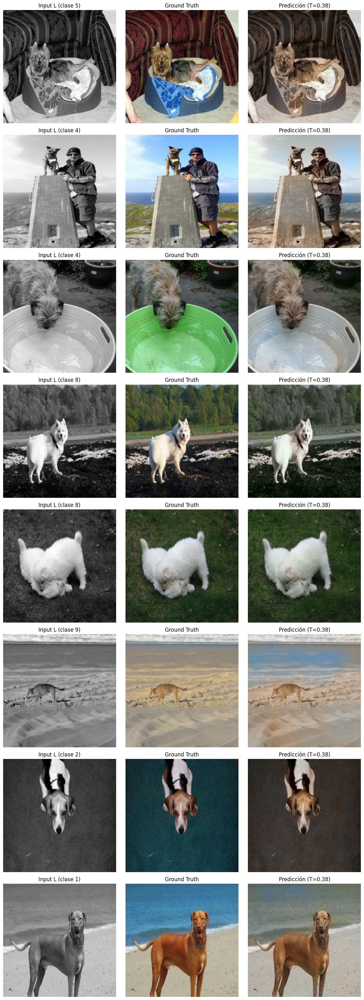

Visualización generada.


In [23]:

def visualize_v4_results(model, loader, pts_ab, device, n_samples=6, T=0.38):
    """
    Visualiza resultados de colorización del modelo V4.
    """
    model.eval()
    
    L_batch, ab_batch, labels_batch = next(iter(loader))
    L_batch = L_batch[:n_samples].to(device)
    ab_batch = ab_batch[:n_samples].to(device)
    
    with torch.no_grad():
        color_logits, scene_logits = model(L_batch)
        ab_pred = decode_ab_annealed(color_logits, pts_ab.to(device), T=T)
    
    # Convertir LAB a RGB
    def lab_to_rgb_batch(L, ab):
        imgs = []
        for i in range(L.shape[0]):
            L_np = L[i, 0].cpu().numpy() * 100.0
            ab_np = ab[i].cpu().numpy()
            
            lab = np.stack([L_np, ab_np[0], ab_np[1]], axis=-1)
            rgb = lab_to_rgb(lab)
            rgb = np.clip(rgb, 0, 1)
            imgs.append(rgb)
        return imgs
    
    rgb_true = lab_to_rgb_batch(L_batch, ab_batch)
    rgb_pred = lab_to_rgb_batch(L_batch, ab_pred)
    
    # Visualizar
    fig, axes = plt.subplots(n_samples, 3, figsize=(12, 4*n_samples))
    
    for i in range(n_samples):
        axes[i, 0].imshow(L_batch[i, 0].cpu(), cmap='gray')
        axes[i, 0].set_title(f'Input L (clase {labels_batch[i].item()})')
        axes[i, 0].axis('off')
        
        axes[i, 1].imshow(rgb_true[i])
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        axes[i, 2].imshow(rgb_pred[i])
        axes[i, 2].set_title(f'Predicción (T={T})')
        axes[i, 2].axis('off')
    
    plt.tight_layout()
    return fig

# Cargar mejor modelo y visualizar
state_best = torch.load("colornet_v4_best.pth", map_location=device)
model_v4.load_state_dict(state_best)

print("Generando visualización...")
fig = visualize_v4_results(model_v4, val_loader_quant, pts_ab_torch, device, 
                           n_samples=8, T=0.38)
plt.show()

print("Visualización generada.")

#### 6.1 Comparación de diferentes temperaturas T

Comparando temperaturas...


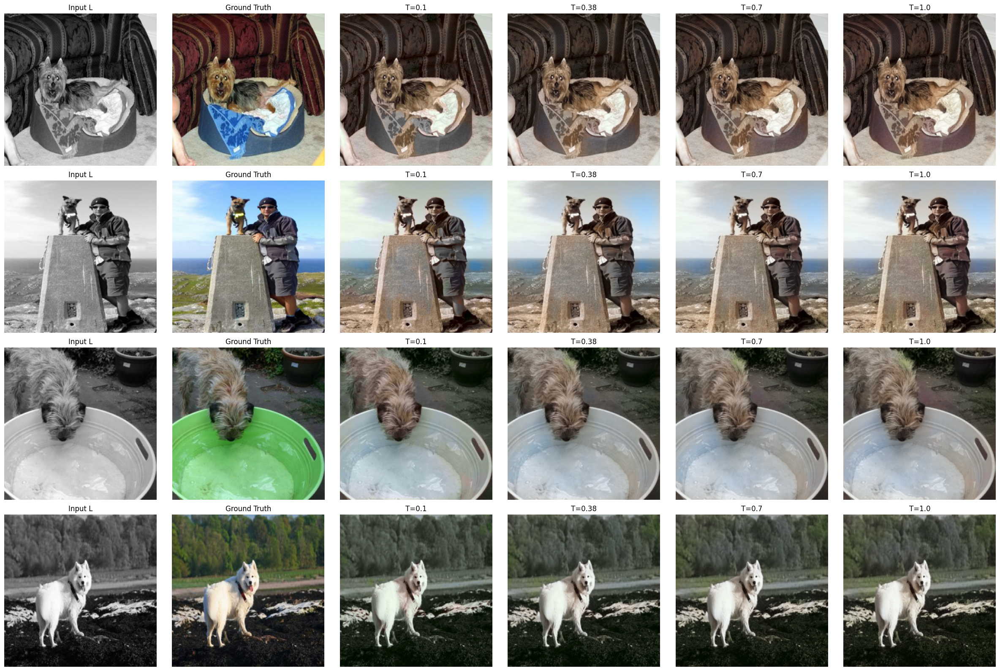

Comparación generada.


In [35]:
def compare_temperatures(model, loader, pts_ab, device, temperatures=[0.1, 0.38, 0.7, 1.0], n_samples=4):
    """
    Compara el efecto de diferentes temperaturas en la decodificación.
    """
    model.eval()
    
    L_batch, ab_batch, labels_batch = next(iter(loader))
    L_batch = L_batch[:n_samples].to(device)
    ab_batch = ab_batch[:n_samples].to(device)
    
    fig, axes = plt.subplots(n_samples, len(temperatures)+2, 
                             figsize=(4*(len(temperatures)+2), 4*n_samples))
    
    with torch.no_grad():
        color_logits, _ = model(L_batch)
        
        for i in range(n_samples):
            # Input grayscale
            axes[i, 0].imshow(L_batch[i, 0].cpu(), cmap='gray')
            axes[i, 0].set_title('Input L')
            axes[i, 0].axis('off')
            
            # Ground truth
            L_np = L_batch[i, 0].cpu().numpy() * 100.0
            ab_np = ab_batch[i].cpu().numpy()
            lab_gt = np.stack([L_np, ab_np[0], ab_np[1]], axis=-1)
            rgb_gt = lab_to_rgb(lab_gt)
            
            axes[i, 1].imshow(np.clip(rgb_gt, 0, 1))
            axes[i, 1].set_title('Ground Truth')
            axes[i, 1].axis('off')
            
            # Predicciones con diferentes temperaturas
            for j, T in enumerate(temperatures):
                ab_pred = decode_ab_annealed(color_logits[i:i+1], pts_ab.to(device), T=T)
                ab_np_pred = ab_pred[0].cpu().numpy()
                lab_pred = np.stack([L_np, ab_np_pred[0], ab_np_pred[1]], axis=-1)
                rgb_pred = lab_to_rgb(lab_pred)
                
                axes[i, j+2].imshow(np.clip(rgb_pred, 0, 1))
                axes[i, j+2].set_title(f'T={T}')
                axes[i, j+2].axis('off')
    
    plt.tight_layout()
    return fig

# Cargar mejor modelo
state_best = torch.load("colornet_v4_best.pth", map_location=device)
model_v4.load_state_dict(state_best)

print("Comparando temperaturas...")
fig = compare_temperatures(model_v4, val_loader_quant, pts_ab_torch, device, 
                          temperatures=[0.1, 0.38, 0.7, 1.0], n_samples=4)
plt.show()

print("Comparación generada.")

#### Imagen Propia!

In [ ]:
# --- Reconstrucción del modelo V4 para cargar pesos ---

# Asegurar imports
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# Crear backbone
backbone_v4 = models.resnet18(pretrained=True)

model_v4 = UNetColorizerGlobalV4(
    num_color_classes=Q,
    num_scene_classes=len(classes),
    backbone=backbone_v4,
    freeze_backbone=True,
    global_dim=256,
).to(device)

print("Modelo V4 reconstruido correctamente.")

# Cargar pesos
state_best = torch.load("colornet_v4_best.pth", map_location=device)
model_v4.load_state_dict(state_best)
model_v4.eval()

print("Pesos cargados correctamente.")


Modelo V4 reconstruido correctamente.
Pesos cargados correctamente.


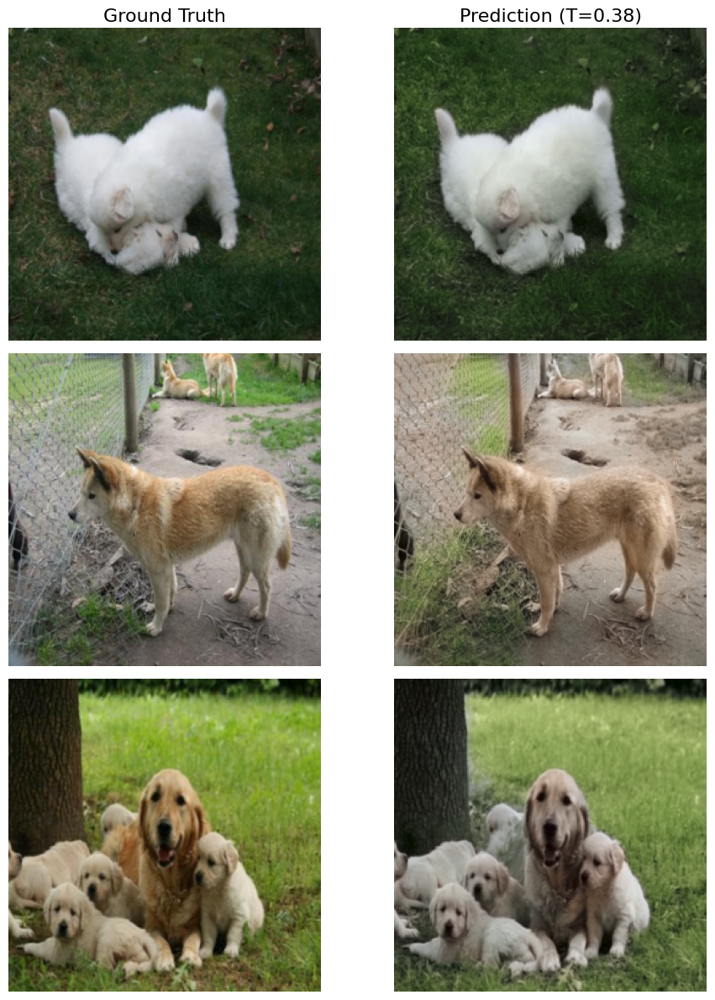

In [ ]:
def visualize_selected_indices_clean(model, dataset, pts_ab, device, indices, T=0.38):
    """
    Visualiza pares (GT, Pred) para índices específicos del dataset,
    con columnas alineadas y solo un título global arriba.
    """
    model.eval()

    fig, axes = plt.subplots(len(indices), 2, figsize=(10, 4 * len(indices)))
    plt.subplots_adjust(top=0.92)

    axes[0, 0].set_title("Ground Truth", fontsize=16)
    axes[0, 1].set_title("Prediction (T=0.38)", fontsize=16)

    with torch.no_grad():
        for row, idx in enumerate(indices):
            L, ab, _ = dataset[idx]

            # Preparar tensores
            L_t = L.unsqueeze(0).to(device)
            ab_t = ab.unsqueeze(0).to(device)

            # Inferencia
            color_logits, _ = model(L_t)
            ab_pred = decode_ab_annealed(color_logits, pts_ab.to(device), T=T)

            # LAB → RGB GT
            L_np = L_t[0, 0].cpu().numpy() * 100
            ab_np_gt = ab_t[0].cpu().numpy()
            lab_gt = np.stack([L_np, ab_np_gt[0], ab_np_gt[1]], axis=-1)
            rgb_gt = np.clip(lab_to_rgb(lab_gt), 0, 1)

            # LAB → RGB Pred
            ab_np_pred = ab_pred[0].cpu().numpy()
            lab_pred = np.stack([L_np, ab_np_pred[0], ab_np_pred[1]], axis=-1)
            rgb_pred = np.clip(lab_to_rgb(lab_pred), 0, 1)

            # Dibujar
            axes[row, 0].imshow(rgb_gt)
            axes[row, 1].imshow(rgb_pred)

            axes[row, 0].axis("off")
            axes[row, 1].axis("off")

    plt.tight_layout()
    plt.show()


indices = [4, 446, 24]   
visualize_selected_indices_clean(model_v4, val_dataset_quant, pts_ab_torch, device, indices)


Encontradas 5 imágenes en 'images/'

Colorizando: images/IMG_5261.jpg


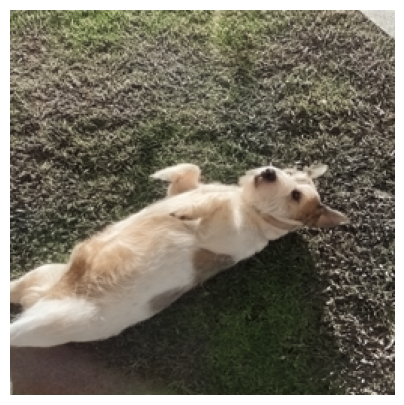


Colorizando: images/IMG_5539.jpg


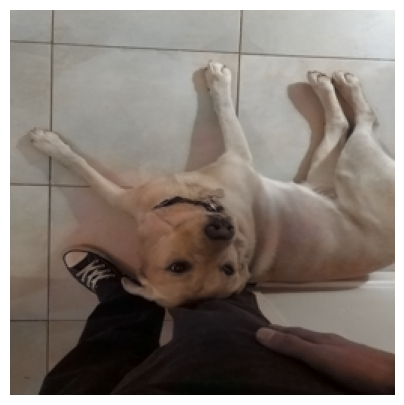


Colorizando: images/IMG_7207.jpg


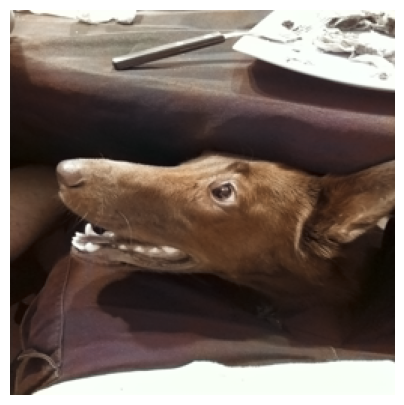


Colorizando: images/IMG_7547.jpg


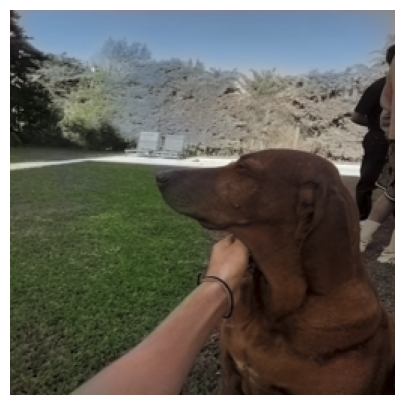


Colorizando: images/IMG_8591.jpg


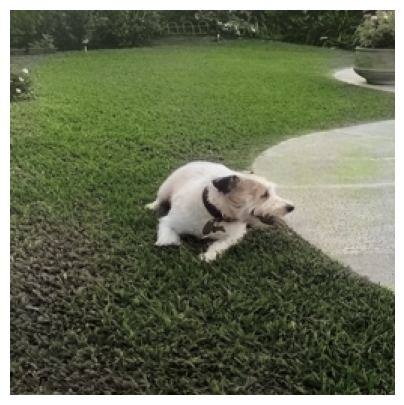

In [39]:
import glob

def colorize_custom_image_single(model, image_path, pts_ab, device, T=1, img_size=256):
    """
    Coloriza solo una imagen y muestra la predicción en RGB.
    No guarda archivos.
    """
    model.eval()

    # Cargar imagen (blanco y negro o RGB)
    img = Image.open(image_path).convert('RGB')
    img_resized = img.resize((img_size, img_size), Image.BICUBIC)
    img_np = np.array(img_resized) / 255.0

    # Convertir a LAB y extraer L
    img_lab = rgb_to_lab(img_np)
    L = img_lab[:, :, 0] / 100.0

    # Tensor
    L_tensor = torch.from_numpy(L).unsqueeze(0).unsqueeze(0).float().to(device)

    with torch.no_grad():
        color_logits, _ = model(L_tensor)
        ab_pred = decode_ab_annealed(color_logits, pts_ab.to(device), T=T)

    # Reconstruir RGB
    L_np = L_tensor[0, 0].cpu().numpy() * 100
    ab_np = ab_pred[0].cpu().numpy()
    lab_pred = np.stack([L_np, ab_np[0], ab_np[1]], axis=-1)
    rgb_pred = np.clip(lab_to_rgb(lab_pred), 0, 1)

    # Mostrar solo la predicción
    plt.figure(figsize=(5, 5))
    plt.imshow(rgb_pred)
    plt.axis("off")
    plt.show()

    return rgb_pred

# Cargar mejor modelo
state_best = torch.load("colornet_v4_best.pth", map_location=device)
model_v4.load_state_dict(state_best)
model_v4.to(device)
model_v4.eval()

# Buscar imágenes dentro de "images/"
image_paths = sorted(glob.glob("images/*"))

print(f"Encontradas {len(image_paths)} imágenes en 'images/'\n")

for img_path in image_paths:
    print(f"Colorizando: {img_path}")
    _ = colorize_custom_image_single(
        model_v4, img_path, pts_ab_torch, device, T=1, img_size=256
    )
    print()
